In [1]:
import numpy as np
import json
import cv2
import pandas as pd
from scipy import ndimage
import matplotlib.pylab as plt

In [2]:
import argparse
import pandas as pd
import numpy as np
#WITHOUT /
def smooth(x,window_len=6,window='hanning'):
    """smooth the data using a window with requested size.
    
    This method is based on the convolution of a scaled window with the signal.
    The signal is prepared by introducing reflected copies of the signal 
    (with the window size) in both ends so that transient parts are minimized
    in the begining and end part of the output signal.
NOTE: length(output) != length(input), to correct this: return y[(window_len/2-1):-(window_len/2)] instead of just y.
    """ 
     
    if x.ndim != 1:
        raise ValueError("smooth only accepts 1 dimension arrays.")

    if x.size < window_len:
        raise ValueError("Input vector needs to be bigger than window size.")
        
    if window_len<3:
        return x
    
    
    #if not window in ['flat', 'hanning', 'hamming', 'bartlett', 'blackman']:
    #    raise ValueError, "Window is on of 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'"
    
    s=np.r_[x[window_len-1:0:-1],x,x[-1:-window_len:-1]]
    #print(len(s))
    if window == 'flat': #moving average
        w=np.ones(window_len,'d')
    else:
        w=eval('np.'+window+'(window_len)')
    
    y=np.convolve(w/w.sum(),s,mode='valid')
    return y  
from numpy import array, zeros, argmin, inf, equal, ndim
from scipy.spatial.distance import cdist

def _traceback(D):
    i, j = array(D.shape) - 2
    p, q = [i], [j]
    while ((i > 0) or (j > 0)):
        tb = argmin((D[i, j], D[i, j+1], D[i+1, j]))
        if (tb == 0):
            i -= 1
            j -= 1
        elif (tb == 1):
            i -= 1
        else: # (tb == 2):
            j -= 1
        p.insert(0, i)
        q.insert(0, j)
    return array(p), array(q)

def fastdtw(x, y, dist):
    """
    Computes Dynamic Time Warping (DTW) of two sequences in a faster way.
    Instead of iterating through each element and calculating each distance,
    this uses the cdist function from scipy (https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.distance.cdist.html)
    :param array x: N1*M array
    :param array y: N2*M array
    :param string or func dist: distance parameter for cdist. When string is given, cdist uses optimized functions for the distance metrics.
    If a string is passed, the distance function can be 'braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation', 'cosine', 'dice', 'euclidean', 'hamming', 'jaccard', 'kulsinski', 'mahalanobis', 'matching', 'minkowski', 'rogerstanimoto', 'russellrao', 'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean', 'wminkowski', 'yule'.
    Returns the minimum distance, the cost matrix, the accumulated cost matrix, and the wrap path.
    """
    assert len(x)
    assert len(y)
    if ndim(x)==1:
        x = x.reshape(-1,1)
    if ndim(y)==1:
        y = y.reshape(-1,1)
    r, c = len(x), len(y)
    D0 = zeros((r + 1, c + 1))
    D0[0, 1:] = inf
    D0[1:, 0] = inf
    D1 = D0[1:, 1:]
    D0[1:,1:] = cdist(x,y,dist)
    C = D1.copy()
    for i in range(r):
        for j in range(c):
            D1[i, j] += min(D0[i, j], D0[i, j+1], D0[i+1, j])
    if len(x)==1:
        path = zeros(len(y)), range(len(y))
    elif len(y) == 1:
        path = range(len(x)), zeros(len(x))
    else:
        path = _traceback(D0)
    return D1[-1, -1] / sum(D1.shape), C, D1, path

In [3]:
def plotting(x, y, path, title):
    fig = plt.figure(figsize = (20,10))
    ax = fig.add_subplot(1,2,1)
    plt.plot(x, label = "template")
    plt.plot(y, label = "test")
    plt.legend()
    plt.title(title)
    # plt.show()
    
    ax = fig.add_subplot(1,2,2)
    plt.plot(x[path[0]], label = "template")
    plt.plot(y[path[1]], label = "test")
    plt.legend()
    plt.title(title)
    plt.show()

def dtak_nn_single_joints(play, template, template_label, plot = False):
    result = []
    for joint in range(len(play[0])):
        # joint = 6
        xy = 1
        # distances = []
        test_sequ = play[:, joint]
        test_sequ = (test_sequ-np.mean(test_sequ))/np.std(test_sequ)
        # for i in range(2, 3): #len(labels_first_ten)):
        sequ = template[:,joint]
        sequ = (sequ-np.mean(sequ))/np.std(sequ)
            # plt.plot(sequ, label = i)
        x = sequ
        y = test_sequ
        dist, cost, acc, path = fastdtw(x, y, dist=lambda x, y: np.linalg.norm(x - y))
        # distances.append(np.sum(cost))
        # ind = np.argmin(distances)
        # nn = joints_array_batter[ind, :, joint, xy]
        # nn = (nn-np.mean(nn))/np.std(nn)
        nn_label = template_label #labels_first_ten[ind]
        # print("label nn", nn_label)
        # x = nn
        # y = test_sequ
        if plot:
            plotting(x,y, path, title = joints_list[joint])
        # dist, cost, acc, path = fastdtw(x, y, dist=lambda x, y: np.linalg.norm(x - y))
        
        loc = list(path[0]).index(nn_label)
        # print(loc)
        #print(path[0][loc])
        res = path[1][loc]
        # print("new label", res)
        result.append(res)
    print(result)
    return int(np.median(result))


def normalize(play):
    means = np.mean(play, axis = 0)
    stds = np.std(play, axis = 0)
    return np.array([(elem-means)/stds for elem in play])

def dtak_nn(play, template, template_label, plot = False):
    x = normalize(play[:, :])
    y = normalize(template[:,:])
    dist, cost, acc, path = fastdtw(x, y, 'mahalanobis')  #dist=lambda x, y: np.linalg.norm(x - y))
    if plot:
        plotting(x,y, path, title = "example")
    loc = list(path[0]).index(template_label)
    res = path[1][loc]
    return res

In [4]:
def get_data(index, cf):
    begin_cf = cf.columns.get_loc("0")
    data_array = cf.iloc[index, begin_cf:begin_cf+167].values
    N = len(data_array)

    nr_joints = len(eval(data_array[0]))
    
    data = np.zeros((N,nr_joints,2))

    for j in range(N):
        if not pd.isnull(data_array[j]):
            data[j]=np.array(eval(data_array[j]))
        else:
            data[j] = data[j-1]
    return data

def only_first(move, minimum_sequ_len = 1):
    while True:
        for i in range(minimum_sequ_len):
            if move[0]!=move[1]-1:
                move = np.delete(move, 0)
            else:
                return move[0]
def first_by_grad(frames_joints_array, relevant_joints_list, cutoff):
    """ 
    frames_joint_array must have size (nr_frames, 18/12 (joints))
    relevant_joints_list: the joints which should be taken into account for the movement
    """
    #frames_joints_array = ndimage.filters.gaussian_filter1d(frames_joints_array, axis =0, sigma = 3)
    gradients = np.array([np.gradient(frames_joints_array[:,joints_list.index(j)], edge_order = 2) 
                          for j in relevant_joints_list]) #["right_knee", "right_ankle", "left_knee", "left_ankle"]])
    # print(gradients.shape)
    mean_gradient = np.median(gradients, axis=0)
    #print(mean_gradient)
    if cutoff>0:
        move = np.where(mean_gradient>cutoff)[0]
    else: 
        move = np.where(mean_gradient<cutoff)[0] 
    print("first_by_grad", move)
    if len(move)>1:
        return only_first(move)
    elif len(move)==1:
        return move[0]
    else:
        return None
    
def find_null(joint_array):
    xn = normalize(joint_array)
    res = []
    for j in range(xn.shape[1]):
        res.append(np.argmin(np.absolute(xn[:,j])))
    return int(np.median(res))

def align_sequence_simple(joint_array, template, label):
    xn = normalize(template)
    yn = normalize(joint_array)
    distance_label = [np.linalg.norm((xn[label]-yn[j])[0]) for j in range(len(xn))]
    inds = np.argsort(distance_label)
    print(inds[:6])
    return int(np.mean(inds[:6]))

def simple_shift(joint_array, template, label):
    xn = normalize(template)# [90:160]
    yn = normalize(joint_array)
    
    gradx = np.gradient(xn, axis = 0)
    grady = np.gradient(yn, axis = 0)
    minx = np.argmin(np.mean(gradx, axis = 1))
    miny = np.argmin(np.mean(grady, axis = 1))
    grad_shift = minx-miny

    diff = []
    #plt.figure(figsize = (20,10))
    #plt.plot(np.mean(xn, axis = 1), linewidth = 4)
    
    for i in range(-20, 20):
        new = np.roll(yn, i, axis = 0)
        #plt.plot(np.mean(new, axis =1), label = i)
        diff.append(np.mean(np.absolute(new-xn)))
    #plt.legend()
    #plt.show()
    #print(diff)
    #print(np.argmin(diff))
    lab_rolls = np.argmin(diff)-20
    return label- int(np.mean([lab_rolls, grad_shift]))

"""def align_sequence_old(joint_array, template, label):
    xn = normalize(template)
    yn = normalize(joint_array)
    distances = []
    for i in range(len(xn)):
        distances.append([np.linalg.norm((yn[i]-xn[j])[0]) for j in range(len(xn))])
    distances = np.array(distances)
    indizes = []
    for i in range(len(xn)):
        indizes.append(np.argmin(distances[i]))
    res = []
    print(indizes, label)
    for ind in range(label-5, label+5):
        try:
            res.append(indizes.index(ind))
        except ValueError:
            continue
    return int(np.mean(res))"""

'def align_sequence_old(joint_array, template, label):\n    xn = normalize(template)\n    yn = normalize(joint_array)\n    distances = []\n    for i in range(len(xn)):\n        distances.append([np.linalg.norm((yn[i]-xn[j])[0]) for j in range(len(xn))])\n    distances = np.array(distances)\n    indizes = []\n    for i in range(len(xn)):\n        indizes.append(np.argmin(distances[i]))\n    res = []\n    print(indizes, label)\n    for ind in range(label-5, label+5):\n        try:\n            res.append(indizes.index(ind))\n        except ValueError:\n            continue\n    return int(np.mean(res))'

In [56]:
videos_b = np.array([np.load("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/outs/batter_example.npy")])
game_id = "490509-3f640b3f-9ba5-4e89-8f72-97c9f333aa2c"
center_csv = pd.read_csv("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/cf_data.csv")
center_csv = center_csv[center_csv["Player"]=="Batter"]
games_batter = center_csv["Game"].values.tolist()
ind = games_batter.index(game_id)
joints_array_batter = np.array([get_data(ind, center_csv)])
joints_array_batter = ndimage.filters.gaussian_filter1d(joints_array_batter, axis =1, sigma = 3)
print(joints_array_batter.shape, videos_b.shape)

/Users/ninawiedemann/anaconda/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (253,254,255,256,257,258,259,289) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(1, 167, 18, 2) (1, 167, 110, 110)


In [5]:
# path="/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/outs/out_joints_sv/batter/"
# path_videos = "/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/outs/out_joints_sv/numpy_arrays_batter/"
#path="/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/outs/batter/"
#path_videos = "/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/outs/batter/"
path = "/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/out_testing_batter/"
path_videos = path
from os import listdir
import codecs
import json
videos_b = []
joints_array_batter = []
files = []
csv = pd.read_csv("/Users/ninawiedemann/Desktop/UNI/Praktikum/csvs/csv_new_videos.csv")
#csv = csv[csv["Player"]=="Batter"]
hit_into = []
play_outcome = []
outcomes = csv["Play Outcome"].values
release = []

with open(path+"release_frames", "r") as infile:
    release_frame = json.load(infile)

for fi in listdir(path):
    if fi[-5:]==".json":
        files.append(fi[:-5])
        line = csv[csv["play_id"]==fi[:-5]]
        try:
            hit_into.append(line["Hit into play?"].values[0])
            release.append(release_frame[fi[:-5]])
        except IndexError:
            continue
        except KeyError:
            continue
            
        play_outcome.append(line["Play Outcome"].values[0])
        videos_b.append(np.load(path_videos+fi[:-5]+"_video.npy"))
        obj_text = codecs.open(path+fi, encoding='utf-8').read()
        joints_array_batter.append(json.loads(obj_text))

# 88009707-e682-405a-8644-92d5b20a155e_video.npy
# "88009707-e682-405a-8644-92d5b20a155e.json"

joints_array_batter = np.array(joints_array_batter)
videos_b = np.array(videos_b)
joints_array_batter = ndimage.filters.gaussian_filter1d(joints_array_batter, axis =1, sigma = 3)
print(videos_b.shape, joints_array_batter.shape)
print(hit_into)
print(play_outcome)
print(release)

(17, 167, 110, 110) (17, 167, 18, 2)
['yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'yes', 'yes']
['[Hit into play, run scoring/Batter],[Single/Batter],Player fielded the ball/Right fielder', '[Hit into play/Batter],[Force out/Batter],Assists/3rd baseman,Putouts/2nd baseman,Ground out/Pitcher', '[Hit into play, no outs/Batter],[Single/Batter],Player fielded the ball/Shortstop', '[Hit into play, no outs/Batter],[Double/Batter],Player fielded the ball/Right fielder', '[Hit into play, run scoring/Batter],[Single/Batter],Player fielded the ball/Right fielder', '[Hit into play, no outs/Batter],[Single/Batter],Player fielded the ball/Right fielder', '[Hit into play, run scoring/Batter],[Home run/Batter]', '[Hit into play, no outs/Batter],[Double/Batter],Player fielded the ball/Left fielder', '[Hit into play, run scoring/Batter],[Double/Batter],Player fielded the ball/Center fielder', '[Hit into play, run scoring/Batter],[Single/Batte

17


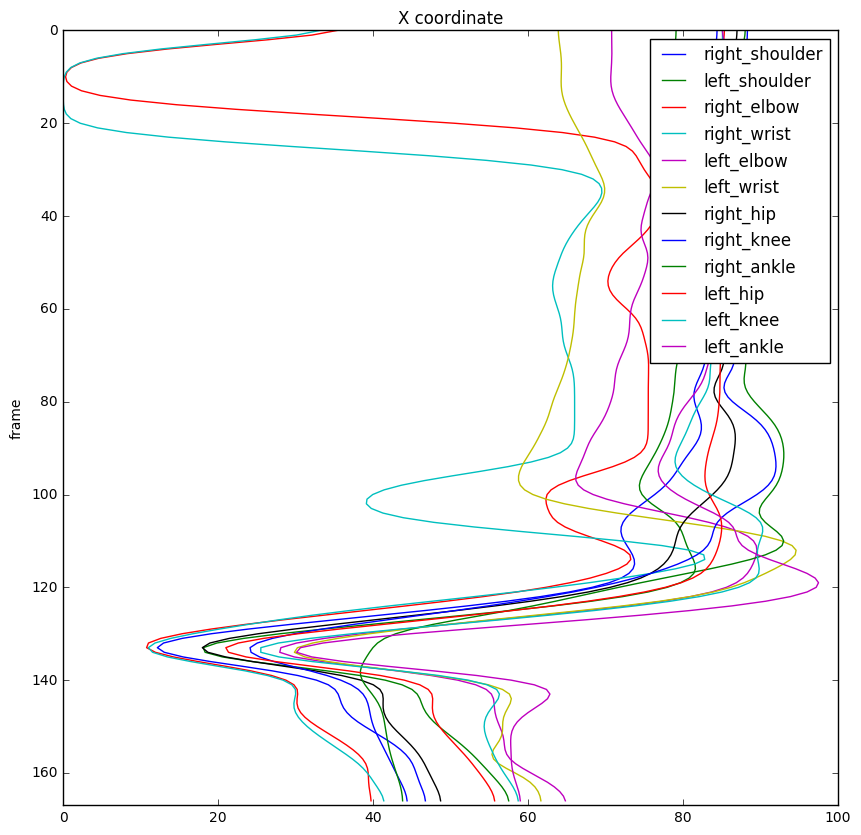

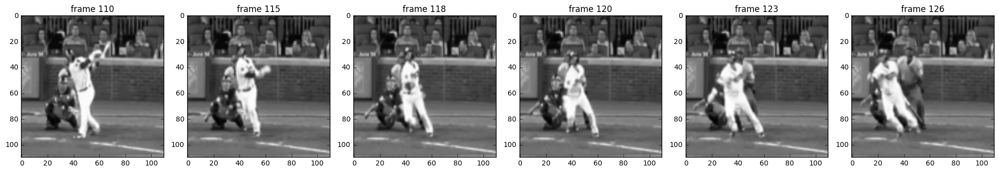

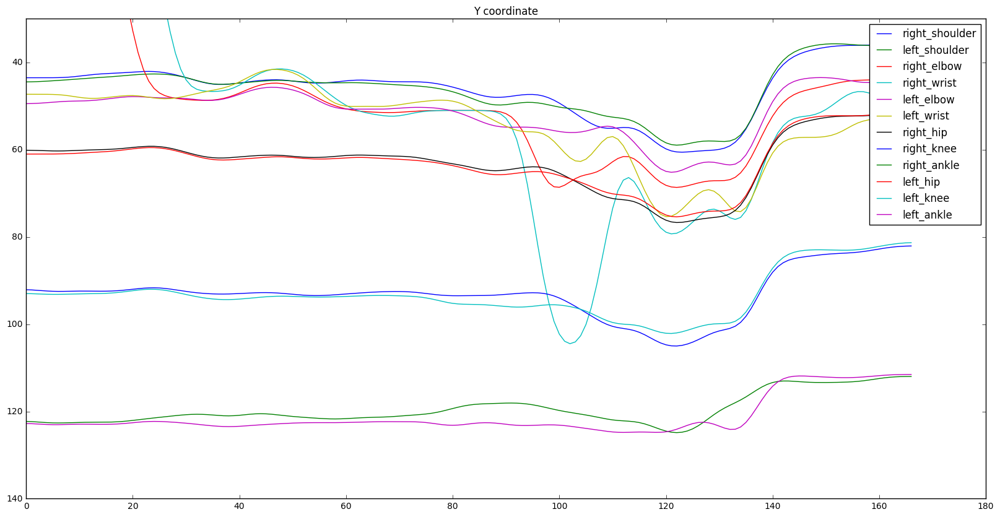

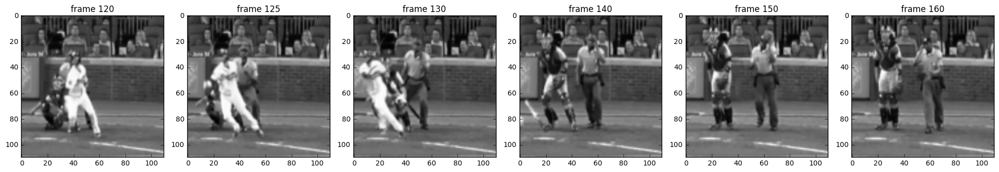

In [6]:
print(np.sum(np.array(hit_into)=="yes"))
import matplotlib.pylab as plt

joints_list = ["right_shoulder", "left_shoulder", "right_elbow", "right_wrist","left_elbow", "left_wrist",
        "right_hip", "right_knee", "right_ankle", "left_hip", "left_knee", "left_ankle", "neck ",
        "right_eye", "right_ear","left_eye", "left_ear"]
# print(files)
one_joint = "left_knee"
video_choice = files.index("fccab683-5fcc-408c-be43-56eb18118371")
#SMOOTHING

plt.figure(figsize = (10,10))
for j in joints_list[:12]:
    plt.plot(joints_array_batter[video_choice,:,joints_list.index(j), 1], np.arange(0,167,1), label = j)
plt.title("X coordinate")
plt.ylim(167,0)
plt.ylabel("frame")
plt.legend()
plt.show()

# Plot video frames to visualize maxima in X coordinates
show_frames = [110, 115, 118, 120, 123, 126]
fig = plt.figure(figsize=(20, 5))
for ind, i in enumerate(show_frames):
    ax = fig.add_subplot(1,len(show_frames),ind+1)
    plt.imshow(videos_b[video_choice,i])
    plt.title("frame "+str(i))
    plt.gray()
plt.tight_layout()
plt.show()


plt.figure(figsize = (20,10))
for j in joints_list[:12]: #[one_joint]: 
    plt.plot(joints_array_batter[video_choice,:,joints_list.index(j), 0], label = j)
plt.legend()
plt.ylim(140, 30)
plt.title("Y coordinate")
plt.show()

# Plot video frames to visualize maxima in Y coordinates
show_frames = [ 120, 125, 130, 140, 150, 160]
fig = plt.figure(figsize=(20, 5))
for ind, i in enumerate(show_frames):
    ax = fig.add_subplot(1,len(show_frames),ind+1)
    plt.imshow(videos_b[video_choice,i])
    plt.title("frame "+str(i))
plt.tight_layout()
plt.show()


 
 
 

--------------NEW VIDEO ------------------
0580fff9-e865-461f-8223-6c728b2fc0c0
[Hit into play, run scoring/Batter],[Single/Batter],Player fielded the ball/Right fielder
-----------------Hit into play?  yes -----------
first_by_grad [121 122 123 124 125 126 127 128 129 130 131 132 133]
[122, 122, 128, 122, 122, 124]
[122 155 156 123 121 154]
[144 143 145 142 146 166]
--------------START RUN:  119 ------------------


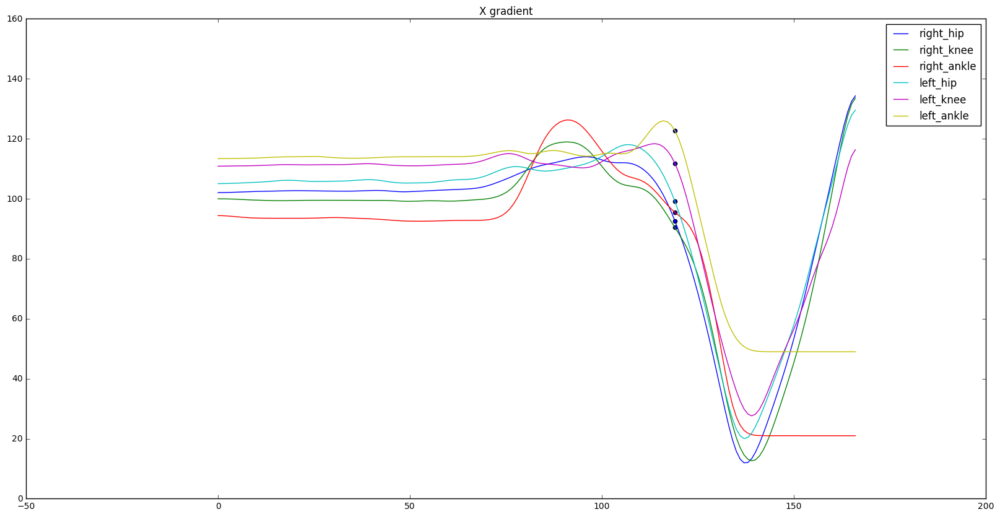

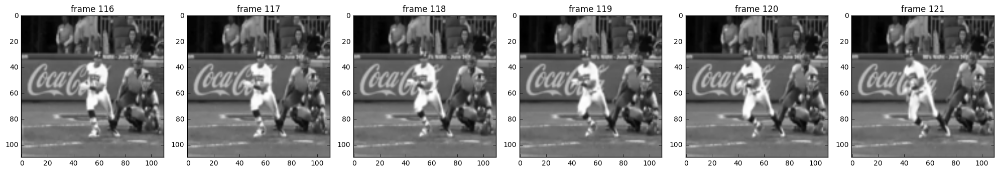


 
 
 

--------------NEW VIDEO ------------------
07999d72-fecf-43fe-b980-5a034a064ad0
[Hit into play/Batter],[Force out/Batter],Assists/3rd baseman,Putouts/2nd baseman,Ground out/Pitcher
-----------------Hit into play?  yes -----------
first_by_grad []
[128, 124, 123, 129, 130, 99]
[128 127 129 126 130 125]
[152 153 154 151 155 156]
--------------START RUN:  130 ------------------


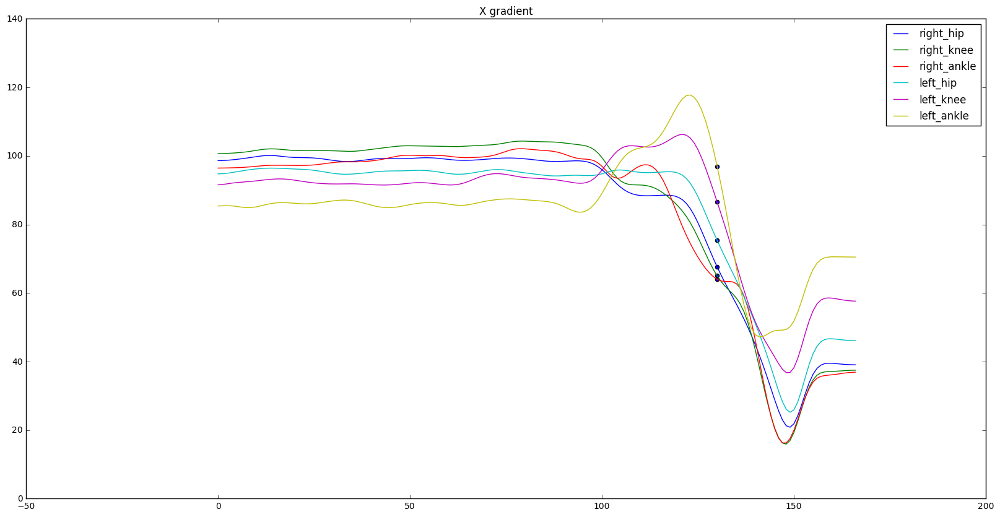

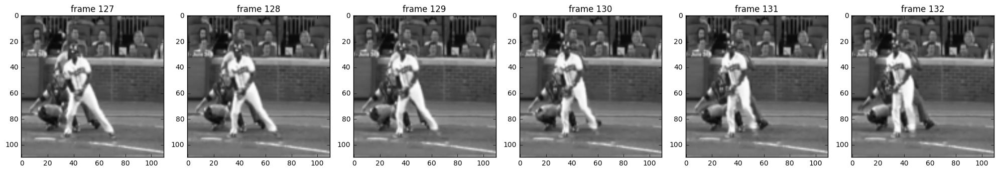


 
 
 

--------------NEW VIDEO ------------------
111b35bd-cdf2-4ad0-a01f-d05924930c1c
[Hit into play, no outs/Batter],[Single/Batter],Player fielded the ball/Shortstop
-----------------Hit into play?  yes -----------
first_by_grad [124 125 126 127 128 129 130]
[118, 118, 118, 118, 118, 118]
[118 117 119 116 115 120]
[118 130 131 117 119 129]
--------------START RUN:  128 ------------------


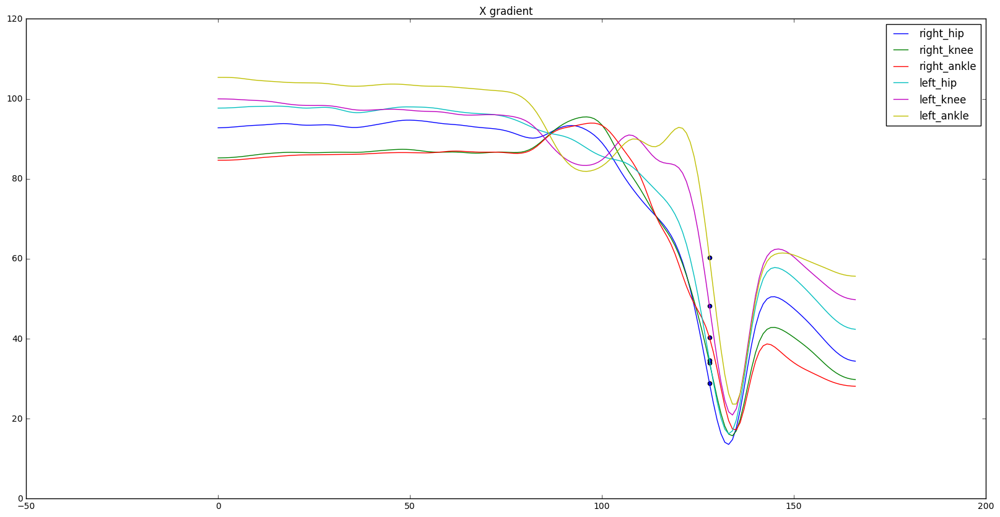

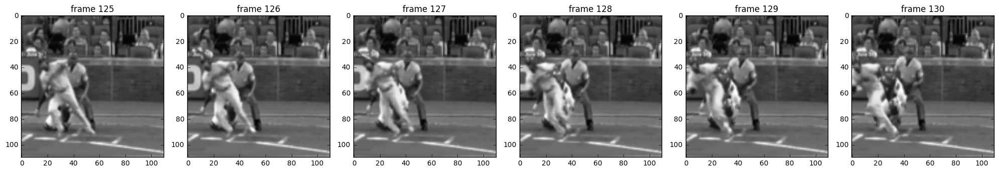


 
 
 

--------------NEW VIDEO ------------------
21d0a9cf-598a-4c83-a511-2caac93b2a08
[Hit into play, no outs/Batter],[Double/Batter],Player fielded the ball/Right fielder
-----------------Hit into play?  yes -----------
first_by_grad [126 127 128 129 130 131 132 133 134]
[129, 127, 128, 129, 130, 99]
[129 128 127 130 126 131]
[130 129 131 128 127 126]
--------------START RUN:  127 ------------------


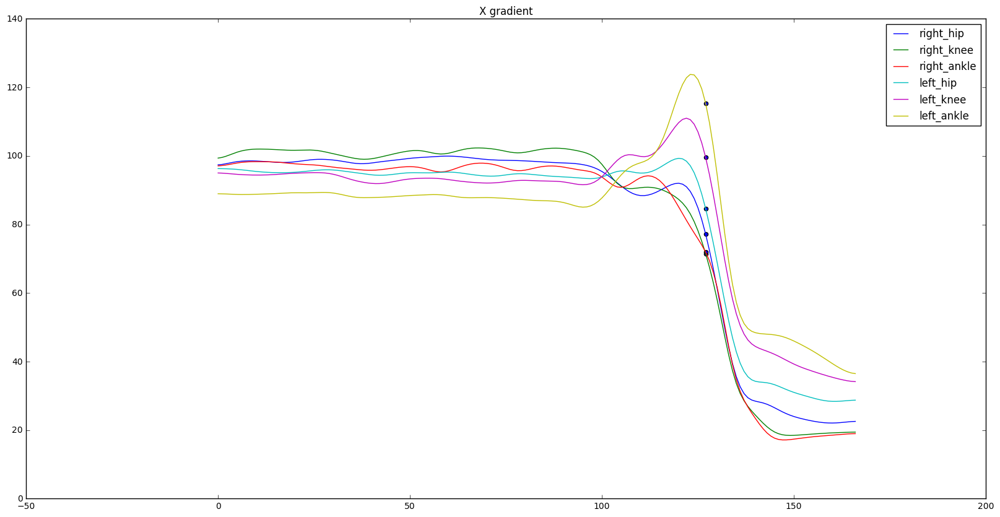

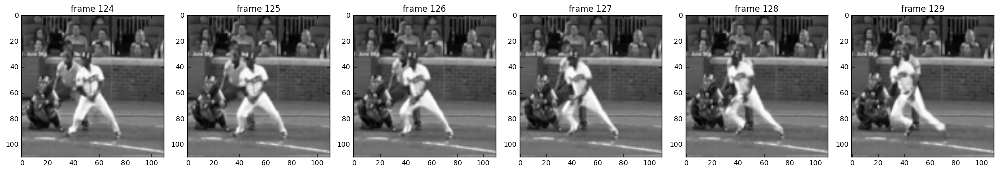


 
 
 

--------------NEW VIDEO ------------------
4999b519-db1f-4e33-b98f-95ecaec4f39a
[Hit into play, run scoring/Batter],[Single/Batter],Player fielded the ball/Right fielder
-----------------Hit into play?  yes -----------
first_by_grad [119 120 121 122]
[106, 106, 106, 106, 105, 115]
[106 166 165 164 163 105]
[118 119 117 120 106 116]
--------------START RUN:  125 ------------------


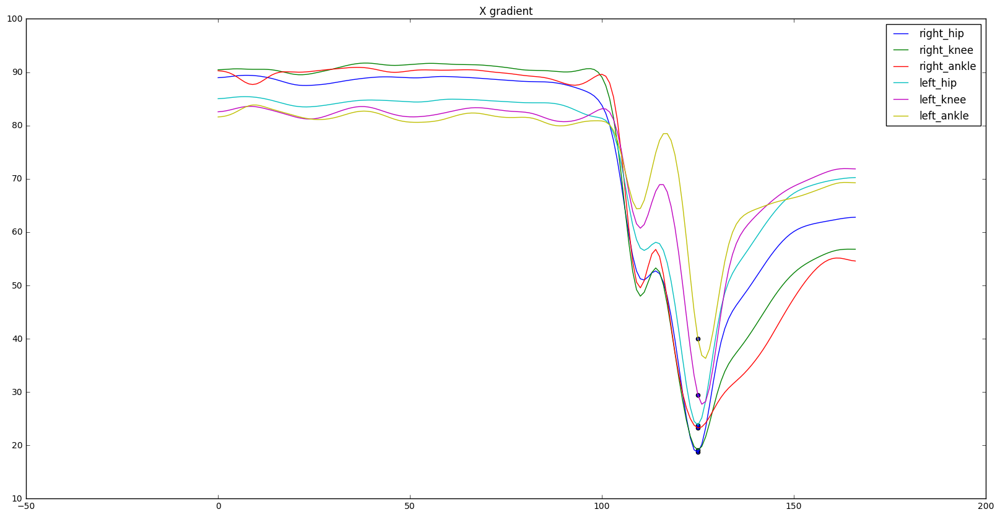

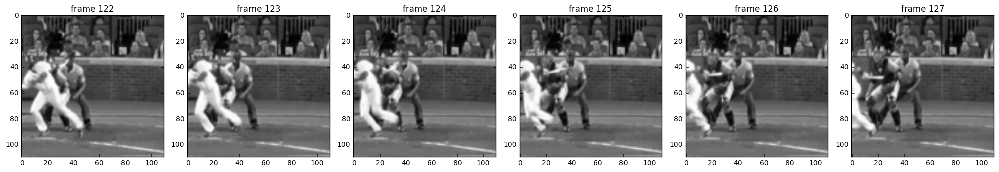


 
 
 

--------------NEW VIDEO ------------------
59ae29f6-d14f-4c8c-a7e7-89f5a850e704
[Hit into play, no outs/Batter],[Single/Batter],Player fielded the ball/Right fielder
-----------------Hit into play?  yes -----------
first_by_grad [116 117 118 119 120 121 122 123 124]
[117, 118, 119, 117, 119, 121]
[117 116 118 115 119 114]
[117 109 110 116 118 115]
--------------START RUN:  116 ------------------


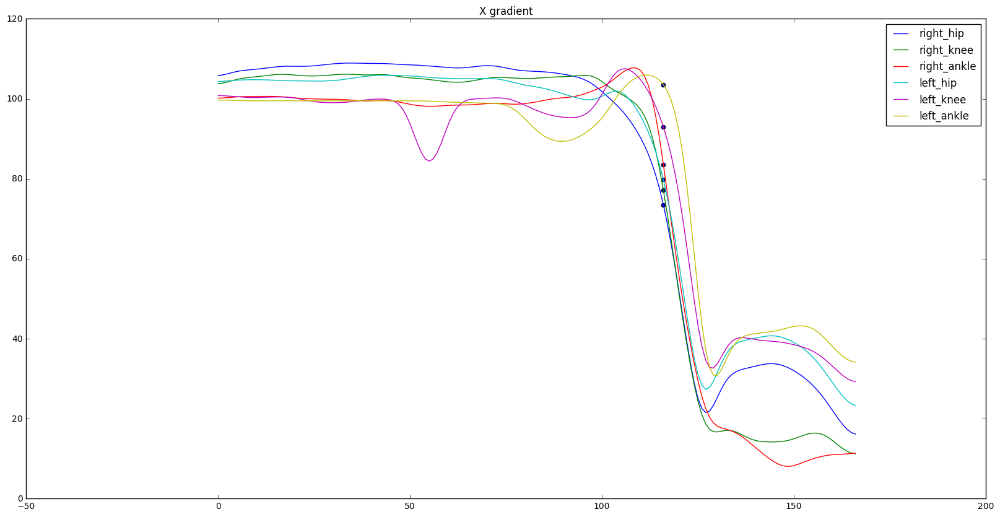

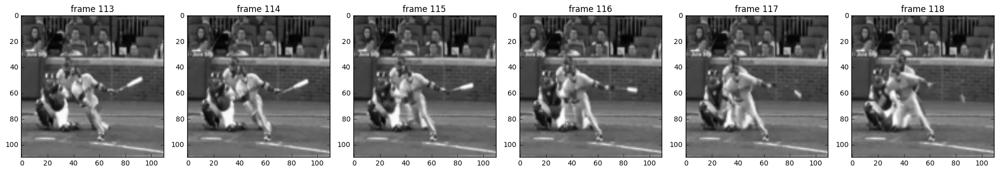


 
 
 

--------------NEW VIDEO ------------------
6852b6f9-fcc7-43df-bad3-797c407da2ec
[Hit into play, run scoring/Batter],[Home run/Batter]
-----------------Hit into play?  yes -----------
first_by_grad [129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145]
[132, 132, 137, 132, 132, 134]
[132 133 131 134 130 135]
[129 128 130 127 131 132]
--------------START RUN:  131 ------------------


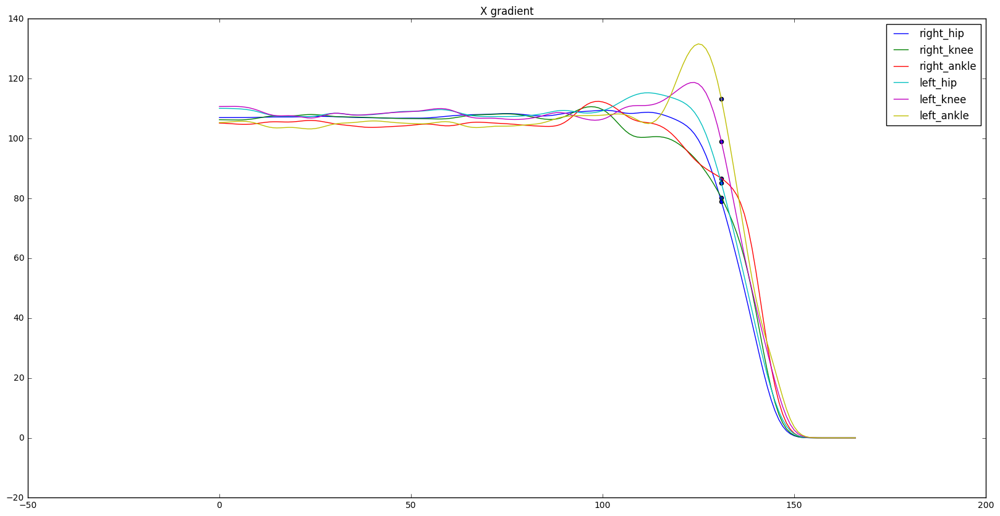

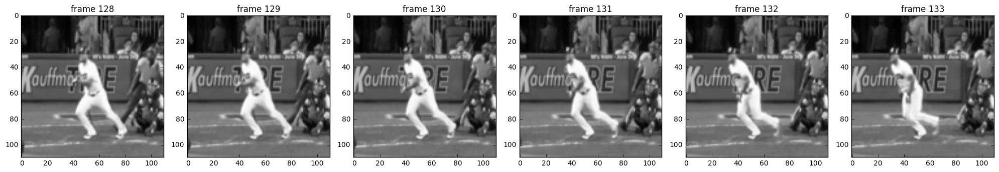


 
 
 

--------------NEW VIDEO ------------------
81c2c57c-ca32-46ad-bfb6-b24353992d02
[Hit into play, no outs/Batter],[Double/Batter],Player fielded the ball/Left fielder
-----------------Hit into play?  yes -----------
first_by_grad [129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146]
[135, 136, 139, 135, 134, 135]
[135 136 134 137 133 138]
[131 130 132 133 129 134]
--------------START RUN:  133 ------------------


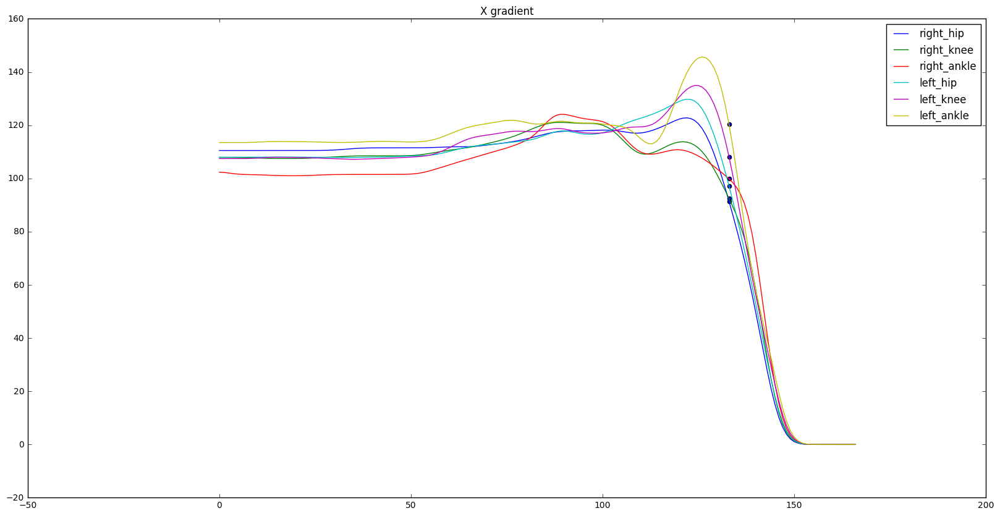

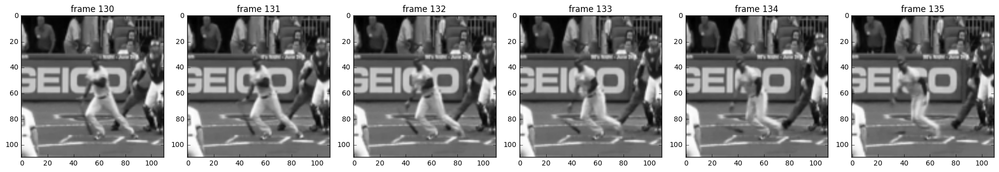


 
 
 

--------------NEW VIDEO ------------------
826de5e4-4539-4c06-8948-914370952ba6
[Hit into play, run scoring/Batter],[Double/Batter],Player fielded the ball/Center fielder
-----------------Hit into play?  yes -----------
first_by_grad [127 128 129 130 131 132 133 134 135 136 137 138 139 140 141]
[131, 132, 135, 130, 130, 131]
[131 130 132 129 128 133]
[132 133 131 134 130 129]
--------------START RUN:  128 ------------------


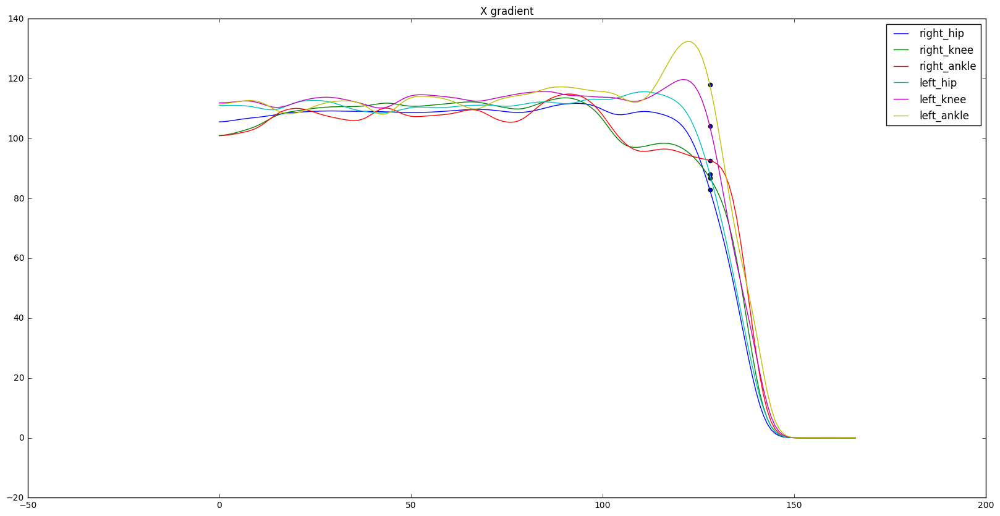

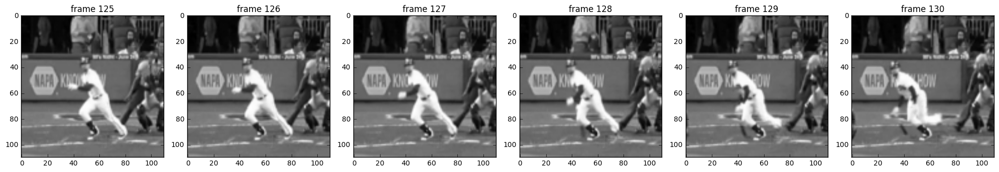


 
 
 

--------------NEW VIDEO ------------------
86bcb330-c84a-4ba4-9f6f-9a32b7756520
[Hit into play, run scoring/Batter],[Single/Batter],Player fielded the ball/Right fielder
-----------------Hit into play?  yes -----------
first_by_grad [124 125 126 127 128 129 130 131 132 133 134 135 136 137 138]
[128, 128, 131, 128, 127, 129]
[128 127 129 126 130 125]
[126 127 125 128 129 124]
--------------START RUN:  125 ------------------


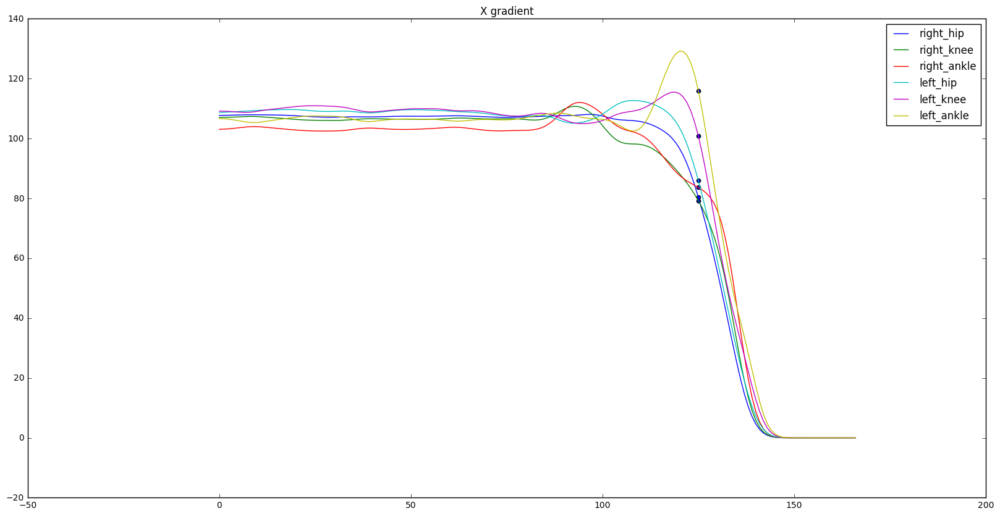

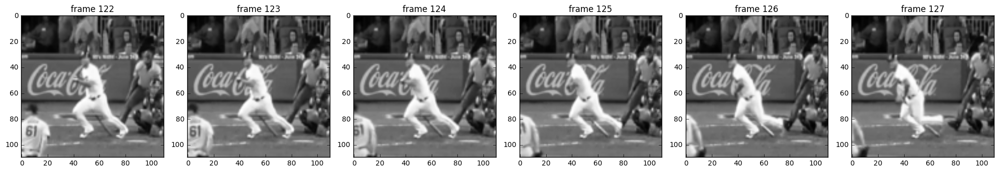


 
 
 

--------------NEW VIDEO ------------------
924345fa-c2d3-4799-a8d0-664e9aa2e272
[Hit into play, no outs/Batter],[Single/Batter],Player fielded the ball/Center fielder
-----------------Hit into play?  yes -----------
first_by_grad [119 120 121 122 123 124 125 126 127 128 129 130 131 132]
[122, 120, 121, 122, 121, 123]
[122 123 121 120 124 119]
[153 154 155 163 164 162]
--------------START RUN:  116 ------------------


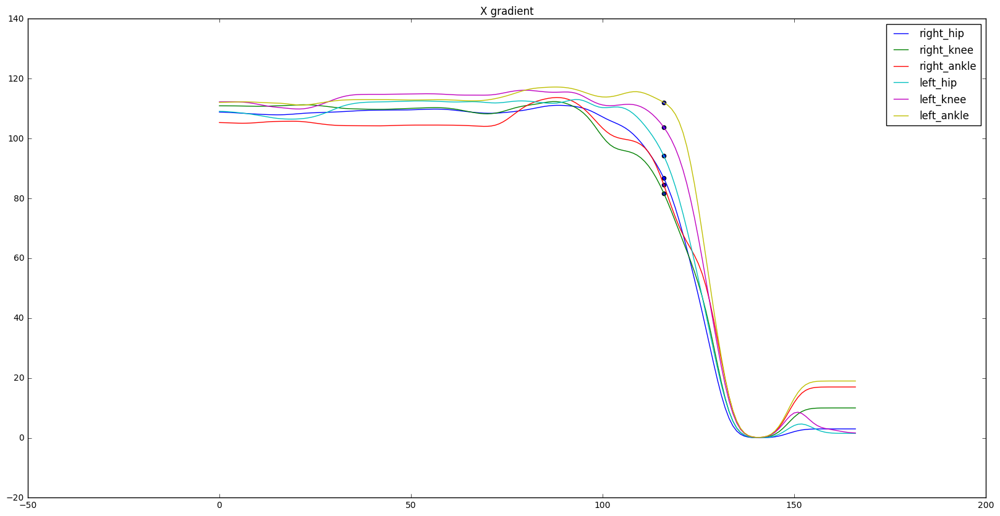

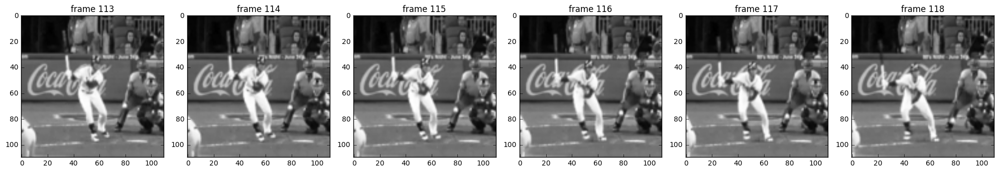


 
 
 

--------------NEW VIDEO ------------------
b714b5d0-0b04-4be6-af93-d62c186ae84a
[Hit into play/Batter],[Force out/Batter],Assists/Pitcher,Putouts/Shortstop,Ground out/Pitcher
-----------------Hit into play?  yes -----------
first_by_grad [118 119 120 121 129 130 131 132 133 134 135 136]
[127, 124, 125, 127, 121, 123]
[127 126 128 125 124 129]
[131 132 130 113 114 133]
--------------START RUN:  114 ------------------


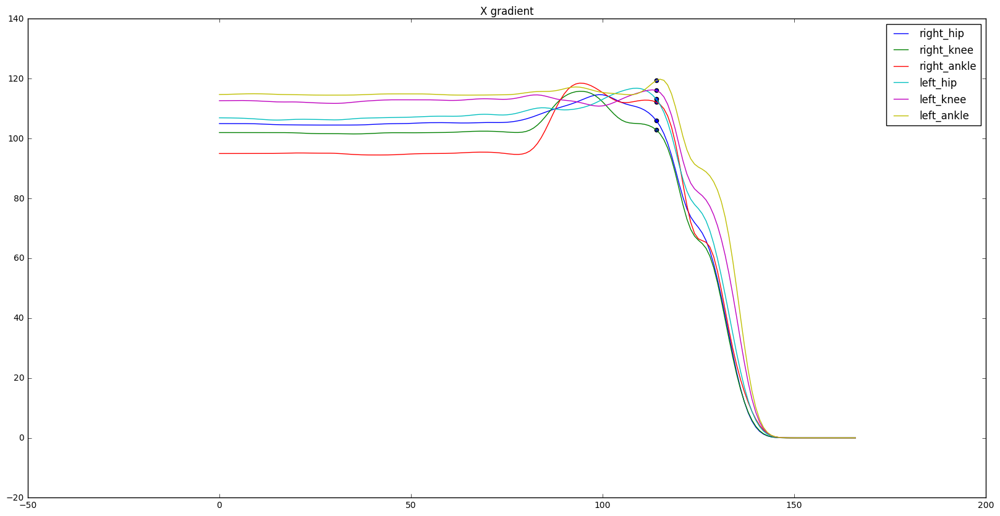

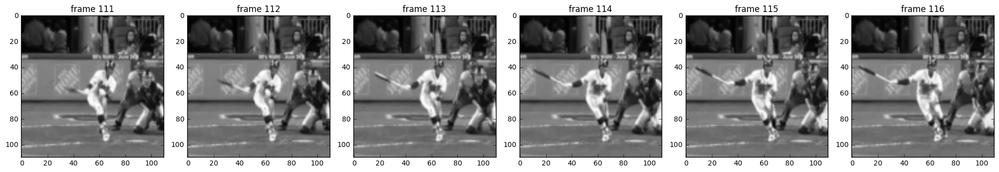


 
 
 

--------------NEW VIDEO ------------------
b7b07ada-bc3e-45b9-a29e-8edbf8ae83d4
[Hit into play, run scoring/Batter],[Home run/Batter]
-----------------Hit into play?  yes -----------
first_by_grad []
[143, 105, 106, 145, 144, 76]
[143 144 142 145 141 140]
[122 111 110 121 123 120]
--------------START RUN:  132 ------------------


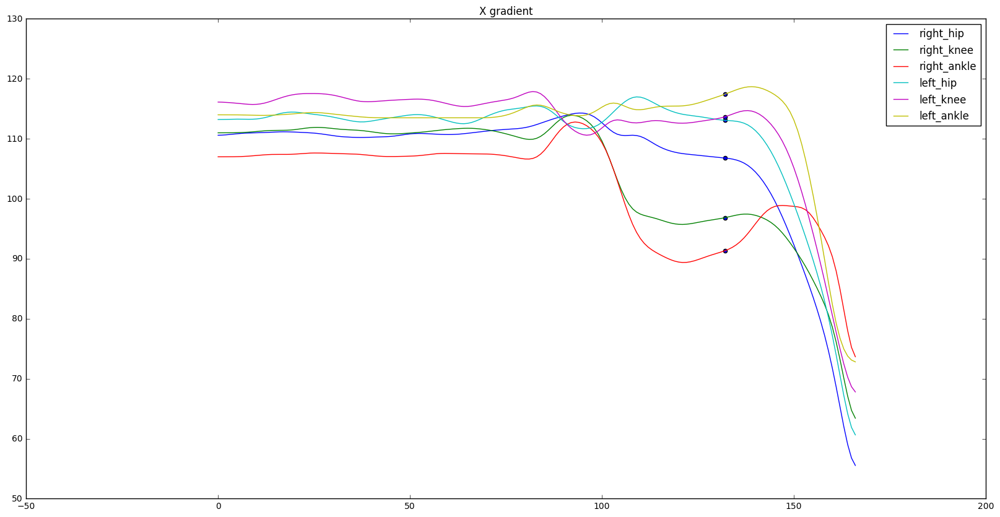

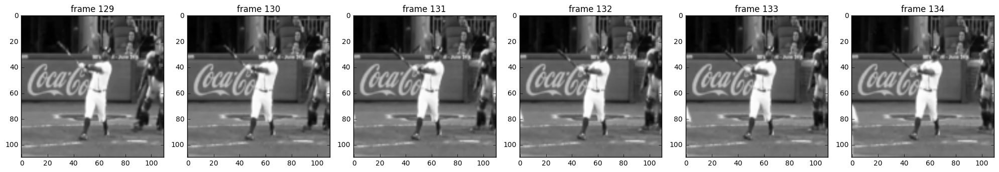


 
 
 

--------------NEW VIDEO ------------------
bcea7caf-24f3-46f5-8397-592e7cd48e8b
[Hit into play, no outs/Batter],[Single/Batter],Player fielded the ball/3rd baseman
-----------------Hit into play?  yes -----------
first_by_grad [122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137]
[127, 127, 129, 127, 125, 127]
[127 126 128 125 129 124]
[131 130 129 128 127 132]
--------------START RUN:  128 ------------------


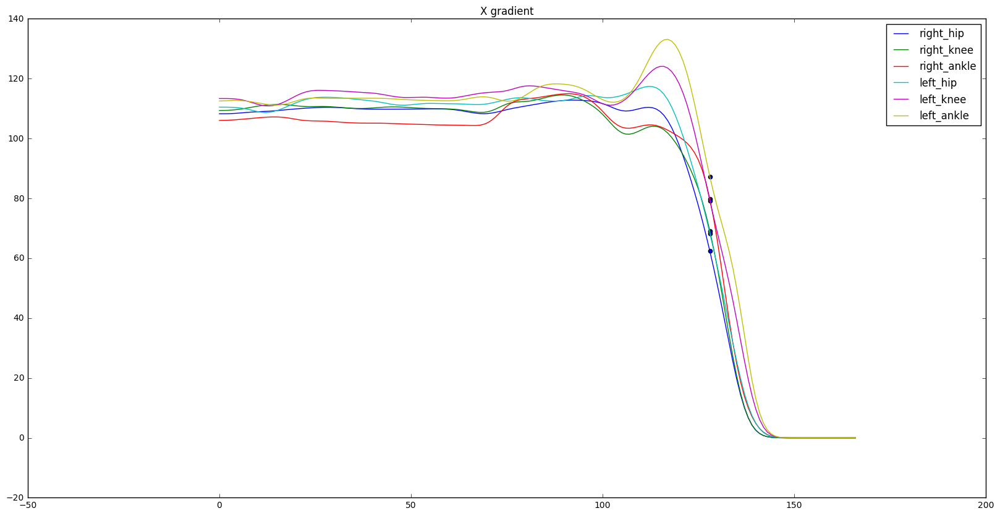

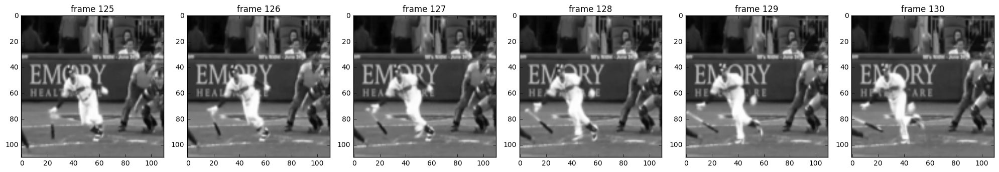


 
 
 

--------------NEW VIDEO ------------------
bfb75d6d-b87c-48b6-bfcb-640659c764c7
[Hit into play/Batter],[Single/Batter],Player fielded the ball/Center fielder
-----------------Hit into play?  yes -----------
first_by_grad [132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148]
[136, 136, 139, 136, 135, 136]
[136 135 137 134 138 133]
[131 130 132 129 133 134]
--------------START RUN:  129 ------------------


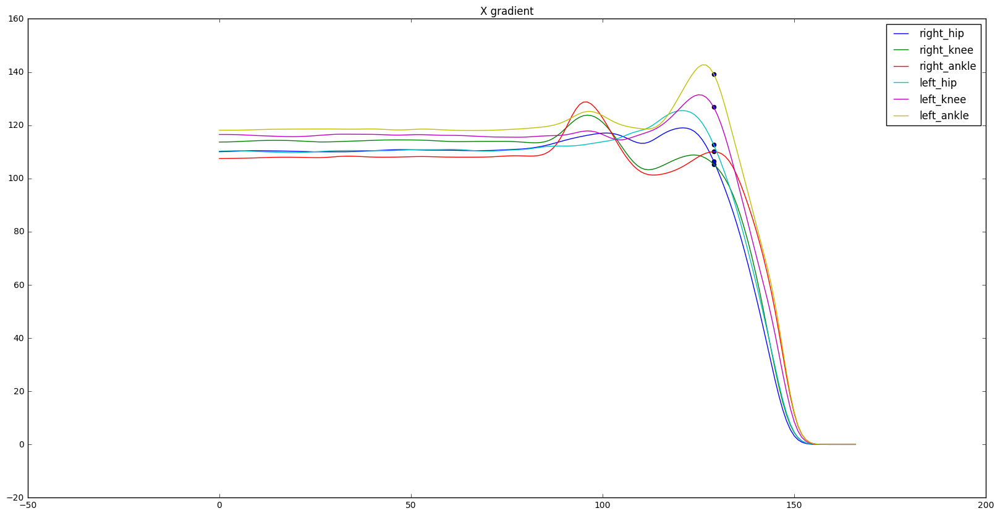

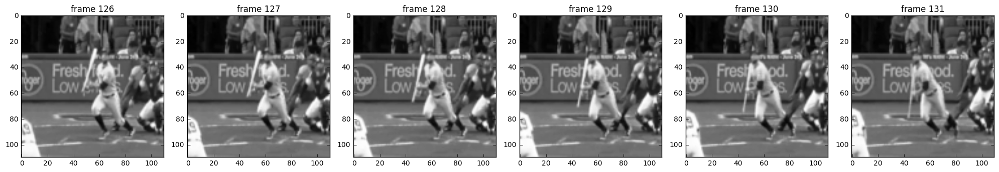


 
 
 

--------------NEW VIDEO ------------------
d90ccbfa-bff4-48eb-ab88-6a473ee02d66
[Hit into play, no outs/Batter],[Single/Batter],Player fielded the ball/Right fielder
-----------------Hit into play?  yes -----------
first_by_grad [124 125 126 127 128 129 130 131 132 133 134 135 136 137]
[126, 125, 130, 126, 124, 125]
[126 127 125 128 124 129]
[132 133 131 130 134 129]
--------------START RUN:  124 ------------------


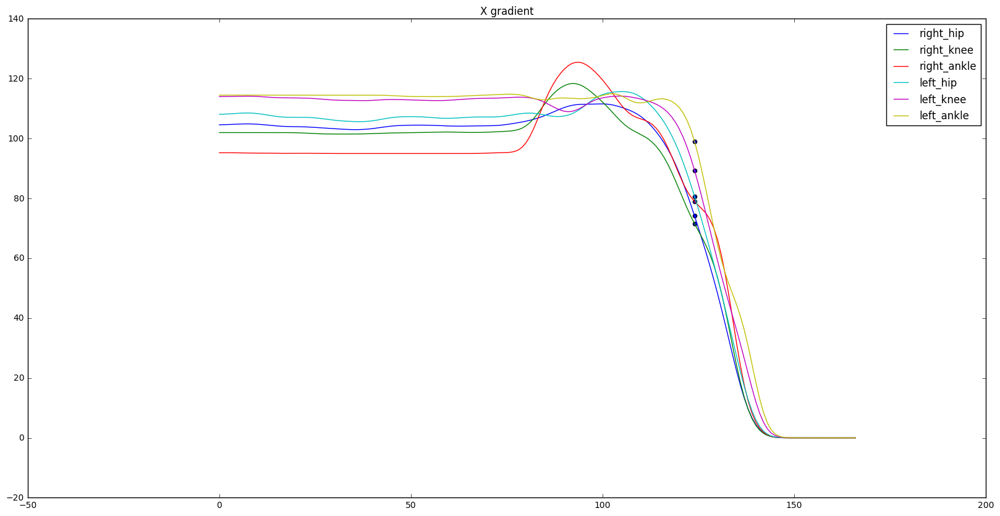

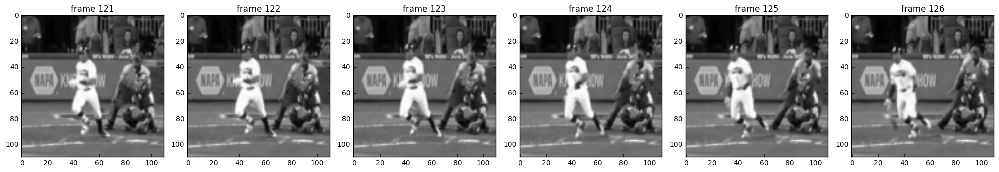


 
 
 

--------------NEW VIDEO ------------------
fccab683-5fcc-408c-be43-56eb18118371
[Hit into play, no outs/Batter],[Single/Batter],Player fielded the ball/Center fielder
-----------------Hit into play?  yes -----------
first_by_grad [123 124 125 126 127 128 129 130]
[122, 121, 121, 123, 123, 101]
[122 121 123 120 124 119]
[130 131 129 119 128 127]
--------------START RUN:  125 ------------------


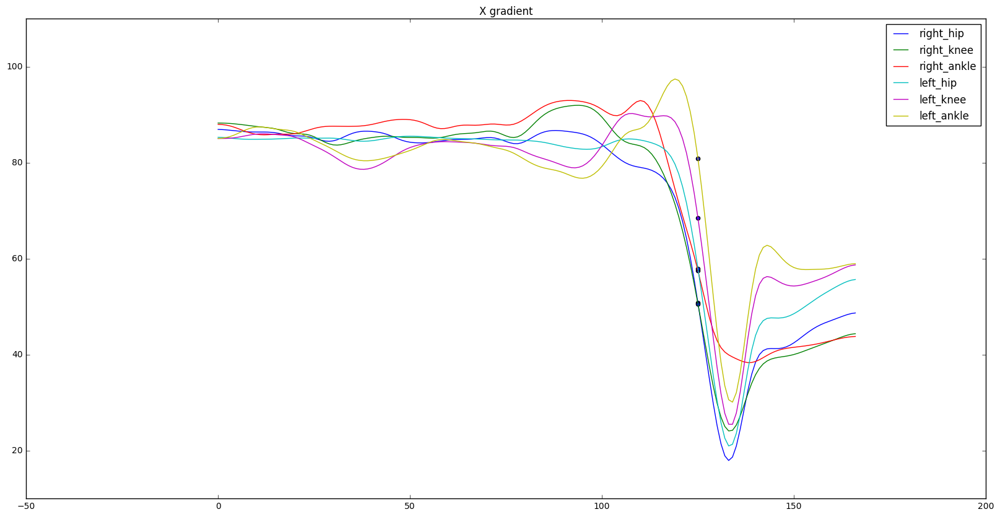

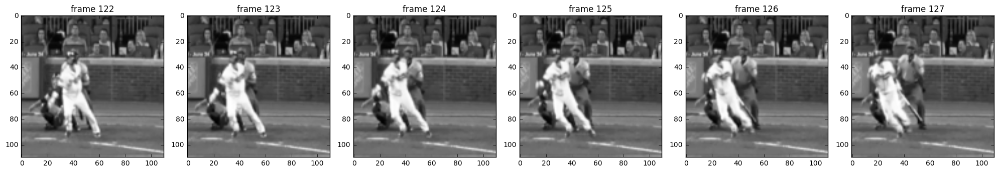

acc_dtak_single 6.05882352941 [ 0  4  8  0 12  1  4  5  7  7  1  4 36  4  4  3  3]
acc_dtak_all_together 9.47058823529 [ 3 15  8 11  6  2 14 17  6  2  2  2 42  3 19  4  5]
acc_dtak_with_y 9.17647058824 [ 4 12  8 10  4  3 13 16  6  3  2  3 42  3 19  4  4]
acc_align_simple 6.82352941176 [16  3  9  0 26  3  4  5  6  6  1  6 18  3  3  4  3]
acc_align_simple_all_coord 10.2352941176 [25 23  2  0  2  5  1  1  7  5 36  5 43  6  1  9  3]
acc_dinf_null 8.94117647059 [ 5 11 16  3 14  3 10  9 11 11  4  3 20  9  8  9  6]
acc_simple_shift 5.58823529412 [ 4 12  8  8  7  4  2  4  0  2  3  3 25  0  5  1  7]
acc_by_grad 3.71626297578 [  1.           3.58823529   2.           2.           1.           3.           1.
   1.           3.           3.           3.           2.          33.58823529
   1.           0.           2.           1.        ]
acc_neural_net 4.76470588235 [ 3  0  2  1  7  3  3  3  4  4  6  6 28  5  3  2  1]


In [7]:
wrong_guy = []#["b7b07ada-bc3e-45b9-a29e-8edbf8ae83d4"] # ["83764a69-2028-4530-8188-f7c37162d403", "46188b82-c795-42e4-8eb1-db3d616d3b4f",
# "889613f9-85f0-4043-864b-f0d486a9816e", "6f014362-1788-43d7-a3fe-91059be02304", "57544774-74dd-4d2c-a2c9-9221ab623d89"]

include_joints = 6
temp = joints_array_batter[2, :, include_joints:12,:]
label = 118

temp_grad = np.gradient(joints_array_batter[0, :, :12, 1], axis = 0)#
acc_by_grad = []
acc_dtak_single = []
acc_dtak_all_together = []
acc_dtak_with_y = []
acc_align_simple = []
acc_align_simple_all_coord = []
acc_dinf_null = []
acc_simple_shift = []
acc_neural_net = []

with open("labels_first_move", "r") as infile:
    labels_first_move = json.load(infile)
    
with open("labels_testing", "r") as infile:
    labels_test = json.load(infile)

true_old = np.array([126, 130, 118, 126, 126, 120, 125, 127, 120, 126, 128, 122, 121, 120, 128, 122, 127, 124, 132])
true = np.array([122, 130, 126, 128, 118, 119, 128, 130, 124, 121, 122, 120, 160, 123, 132, 122, 124])
for video_choice in range(len(joints_array_batter)):
    if hit_into[video_choice]=="no" or "Foul" in play_outcome[video_choice] or files[video_choice] in wrong_guy or "Field out" in play_outcome[video_choice]:
        print(play_outcome[video_choice], files[video_choice])
        continue
    print("\n \n \n \n")
    print("--------------NEW VIDEO ------------------")
    print(files[video_choice])
    print(play_outcome[video_choice])
    # first2 = first_by_grad(joints_array_batter[video_choice, :,:, 0], joints_list[:12], 1)
    # first_move = min(first1, first2)
    # first_move = center_gravity(joints_array[video_choice, :, :12], joint_weights=np.array([1,1, 0.3,0, 0.3, 0, 1, 2,0.5, 1, 2, 0.5]), cutoff = 0.4)
    # grad_pitcher(joints_array_batter[video_choice,:,joints_list.index(j), 0])[0]

    """
    hit_start = first_by_grad(joints_array_batter[video_choice, :,:, 0], joints_list[:6], 1)
    
    print("--------------START HIT: ", hit_start, "------------------")
    
    #hit_ball = local_maxima(joints_array_batter[video_choice, :,:, 1], joints_list[6:12], 6)
    #print("--------------HIT BALL: ", hit_ball, "------------------")
    
    plt.figure(figsize = (20,10))
    for j in joints_list[:6]:
        plt.plot(np.gradient(joints_array_batter[video_choice,:,joints_list.index(j), 0]), label = j)
    plt.legend()
    #plt.ylim(200, 100)
    plt.title("Y gradient")
    plt.show()
    
    if hit_start is not None:
        fig = plt.figure(figsize=(20, 5))
        show_frames = range(hit_start, hit_start+5) #[17, 18, 19, 20, 21]
        for ind, i in enumerate(show_frames):
            ax = fig.add_subplot(1,len(show_frames),ind+1)
            plt.imshow(videos_b[video_choice,i])
            plt.gray()
            plt.title("frame "+str(i))
        plt.tight_layout()
        plt.show()
    """ 
    
    
    print("-----------------Hit into play? ", hit_into[video_choice], "-----------")
    
    grad = first_by_grad(joints_array_batter[video_choice, :,:, 1], joints_list[:12], -4)
    if grad ==None:
        acc_by_grad.append(np.mean(true))
    else:
        acc_by_grad.append(grad)
    single_joints = dtak_nn_single_joints(joints_array_batter[video_choice,:, include_joints:12,1], temp[:,:,1], label)
    acc_dtak_single.append(single_joints)
    # print("single_joints", first_move_single)
    acc_dtak_all_together.append(dtak_nn(joints_array_batter[video_choice, :,include_joints:12,1], temp[:,:,1], label))
    
    resized = np.reshape(joints_array_batter[video_choice, :, include_joints:12,:], (167, 12))
    temp_resized = np.reshape(temp, (167, 12))
    
    acc_dtak_with_y.append(dtak_nn(resized, temp_resized, label))
    # print("mean with release frame", np.mean([first_move, release[video_choice]+30]))
    # grad = np.gradient(joints_array_batter[video_choice,:, :12,1], axis = 0)
    acc_align_simple.append(align_sequence_simple(joints_array_batter[video_choice, :,include_joints:12,1], temp[:,:,1], label))
    # print("only y coord my alignment", first_move_align)
    acc_align_simple_all_coord.append(align_sequence_simple(resized, temp_resized, label))
    acc_dinf_null.append(find_null(resized))
     
    shift = simple_shift(resized, temp_resized, label)
    acc_simple_shift.append(shift)
    acc_neural_net.append(int(labels_test[files[video_choice]]))
    first_move = int(labels_test[files[video_choice]])
    
    if first_move==None:
        continue
    labels_first_move[files[video_choice]]=float(first_move)
    
    
    print("--------------START RUN: ", first_move, "------------------")
    plt.figure(figsize = (20,10))
    for j in joints_list[6:12]:
        plt.plot(joints_array_batter[video_choice,:,joints_list.index(j), 1], label = j)
    plt.legend()
    plt.scatter([first_move for _ in range(include_joints)], joints_array_batter[video_choice, first_move, include_joints:12, 1])
    #plt.ylim(-3, 3)
    plt.title("X gradient")
    plt.show()
    
    if first_move is not None:
        fig = plt.figure(figsize=(20, 5))
        show_frames = range(first_move-3, first_move+3) #[17, 18, 19, 20, 21]
        for ind, i in enumerate(show_frames):
            ax = fig.add_subplot(1,len(show_frames),ind+1)
            plt.imshow(videos_b[video_choice,i])
            plt.gray()
            plt.title("frame "+str(i))
        plt.tight_layout()
        plt.show()

# true = np.delete(true, 12)
print("acc_dtak_single", np.mean(np.absolute(true-acc_dtak_single)), np.absolute(true-acc_dtak_single))
print("acc_dtak_all_together", np.mean(np.absolute(true-acc_dtak_all_together)), np.absolute(true-acc_dtak_all_together))
print("acc_dtak_with_y", np.mean(np.absolute(true-acc_dtak_with_y)), np.absolute(true-acc_dtak_with_y))
print("acc_align_simple", np.mean(np.absolute(true-acc_align_simple)), np.absolute(true-acc_align_simple))
print("acc_align_simple_all_coord", np.mean(np.absolute(true-acc_align_simple_all_coord)), np.absolute(true-acc_align_simple_all_coord))
print("acc_dinf_null", np.mean(np.absolute(true-acc_dinf_null)), np.absolute(true-acc_dinf_null))
print("acc_simple_shift", np.mean(np.absolute(true-acc_simple_shift)), np.absolute(true-acc_simple_shift))
print("acc_by_grad", np.mean(np.absolute(true-acc_by_grad)), np.absolute(true-acc_by_grad))
print("acc_neural_net", np.mean(np.absolute(true-acc_neural_net)), np.absolute(true-acc_neural_net))

In [21]:
print(len(list(labels_first_move.keys())))
with open("labels_first_move", "w") as outfile:
    json.dump(labels_first_move, outfile)

57


In [20]:
for col in csv.columns.tolist():
    print(col)
    nonzero = np.logical_not(pd.isnull(csv[col].values))
    print(np.unique(csv[col].values[nonzero]))

Unnamed: 0
[    0     1     2 ..., 12359 12360 12361]
game_primary_key
[490251 490266 490281 490292 490309 490324 490335 490705 490716 490747
 490762 490770 490780 490795 490808 491107 491122 491137 491153 491167
 491182 491195 491205 491220 491235 491450 491465 491480 491494 491509
 491915 491930 491945 491964 491977 491992 492010 492025 492040 492303
 492318 492333 492413 492428]
play_id
['000135df-5d5f-4b73-8bad-c7f32f207969'
 '000622d0-31d7-4b0c-befd-b7413d64ebe4'
 '000ed30a-60fc-40ef-9db5-510d0171efcd' ...,
 'fff05f3c-673f-436a-8416-bd29e115cd57'
 'fff36cc5-0fe7-4aa1-ab98-a86332818f0b'
 'fffef631-8d09-4d1c-b92e-4ed3369c6130']
venue_id
[4705]
Regular Speed (P)
[ 52.476  61.48   65.095 ...,  99.117  99.258  99.461]
Zone Position X (Trackman)
[-3.68235 -3.35752 -3.2939  ...,  3.01112  3.01613  3.28417]
Zone Position Z (Trackman)
[-2.03974 -1.87173 -1.59887 ...,  5.4806   5.481    5.65229]
Strike Zone Bottom
[ 1.       1.11581  1.13523 ...,  2.04564  2.04684  2.05684]
Umpire Call
['Un

In [43]:
sv = pd.read_csv("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/cf_data.csv")

/Users/ninawiedemann/anaconda/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (253,254,255,256,257,258,259,289) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [48]:
releases = sv["first_movement_frame_index"].values
games = sv["Game"].values.tolist()
nonzero = np.logical_not(pd.isnull(releases))
not_null = releases[nonzero]
over_min = not_null[np.where(not_null>10)]
below_max = over_min[np.where(over_min<130)]
mean = np.mean(below_max)
print("mean", mean)
releases[np.where(np.isnan(releases))] = mean
releases[np.where(releases<=10)] = mean
releases[np.where(releases>=130)] = mean
    
with open("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/notebooks/first_move_frames.json", "r") as infile:
    dic_lab = json.load(infile)
all_files = list(dic_lab.keys())

for i in range(50):
    ind = games.index(all_files[i])
    print("mylabel", dic_lab[all_files[i]], "official", releases[ind], all_files[i])

mean 49.7019776177
mylabel 63 official 33.0 490972-87c8ec63-2d88-4438-b627-c26b634b3891
mylabel 63 official 15.0 491001-1c2712b4-8cfe-4d09-89be-539bc0b1d368
mylabel 62 official 48.0 491001-d57c1e13-d30c-49e3-bdeb-8fb5c7dd78c9
mylabel 82.0 official 58.0 491001-f3604c1a-0060-4fe4-b928-b309ed256ba6
mylabel 86.0 official 70.0 490987-07cc8175-e423-46b3-9a77-aa272dff9cf6
mylabel 83.0 official 45.0 490959-ac231ad4-2c7a-4982-80ad-166bf78f31cd
mylabel 60.0 official 28.0 490972-1a5cd899-91b8-4cc5-841c-8cf38b1f1d15
mylabel 62.0 official 21.0 490972-5d6cfbd2-de5e-4710-81af-7e0037e16944
mylabel 76.0 official 67.0 490959-b996ebf3-4b48-4814-8368-f104110d524d
mylabel 76.0 official 72.0 490987-f28861ea-2e04-4764-b851-ce9fd4caf400
mylabel 86.0 official 70.0 490987-e9945e91-66ad-48c7-9db0-4ff65b23b6d6
mylabel 89.0 official 38.0 491001-46a57a77-dd30-4500-bf8a-dd3fb893ee25
mylabel 63.0 official 67.0 490987-9f377a73-7711-4882-b212-247b11d21f3b
mylabel 90.0 official 68.0 491001-69cad339-0478-45c5-96ed-97c6e8

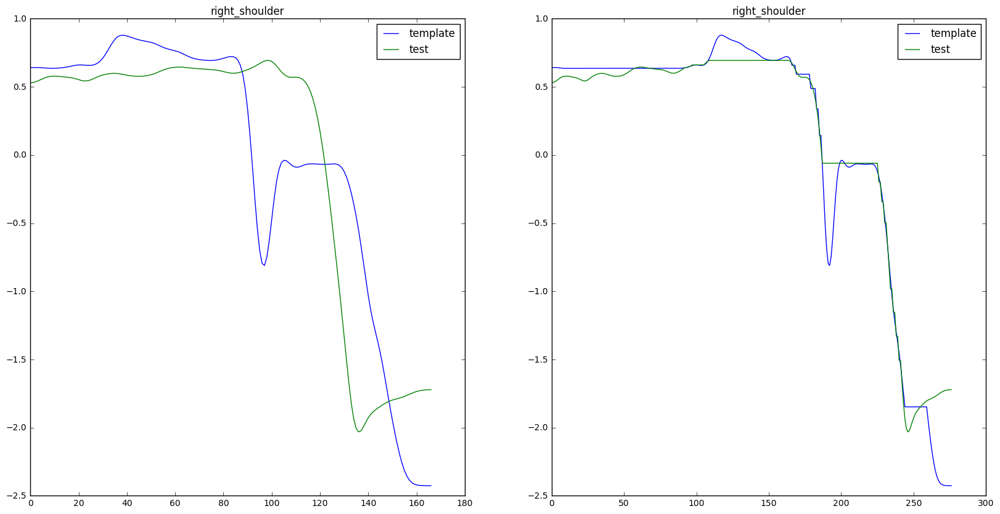

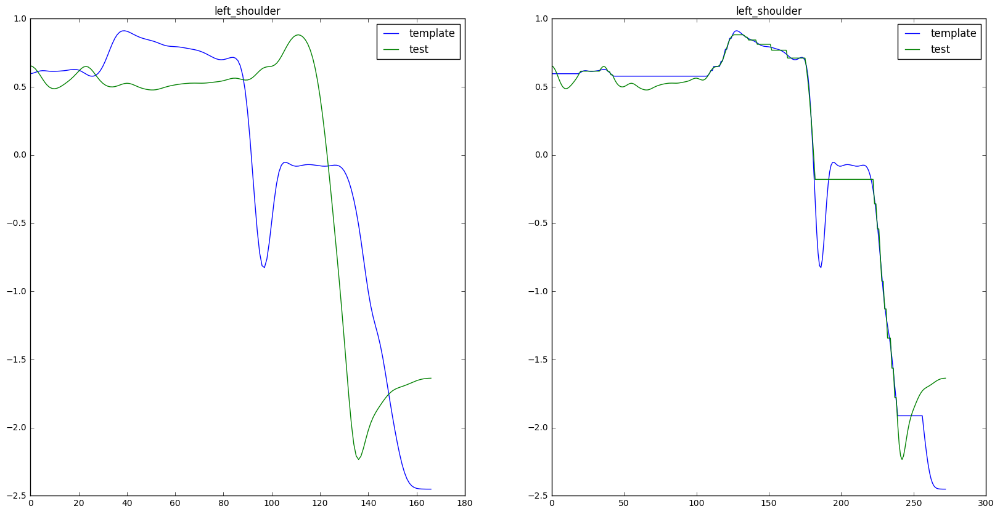

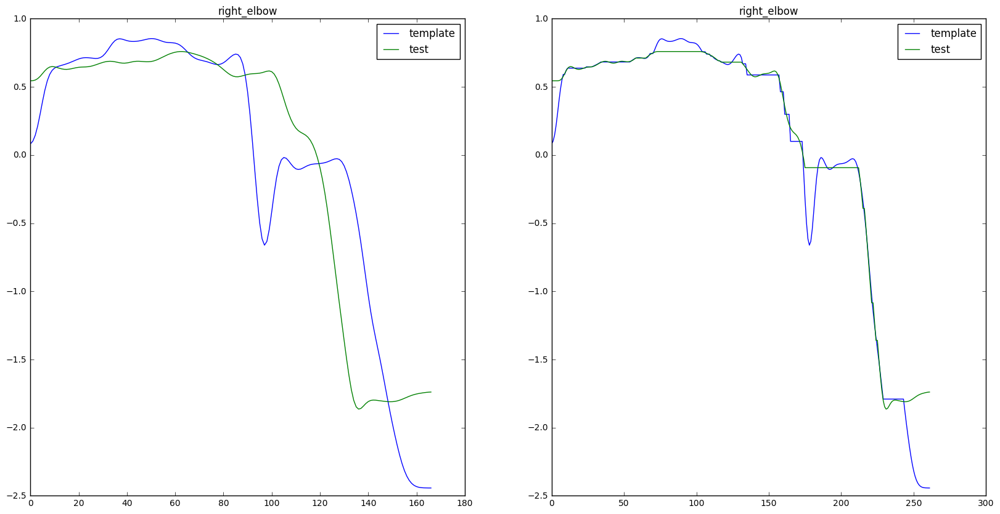

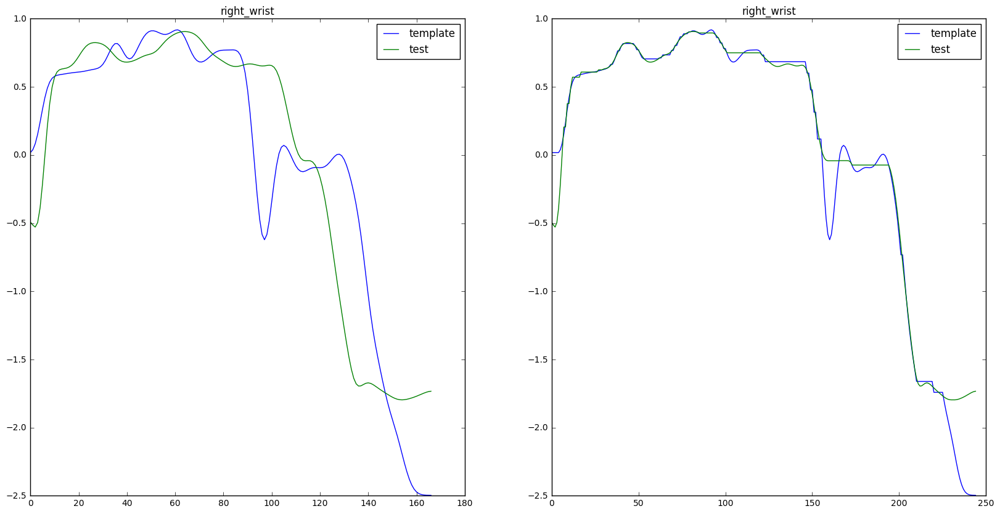

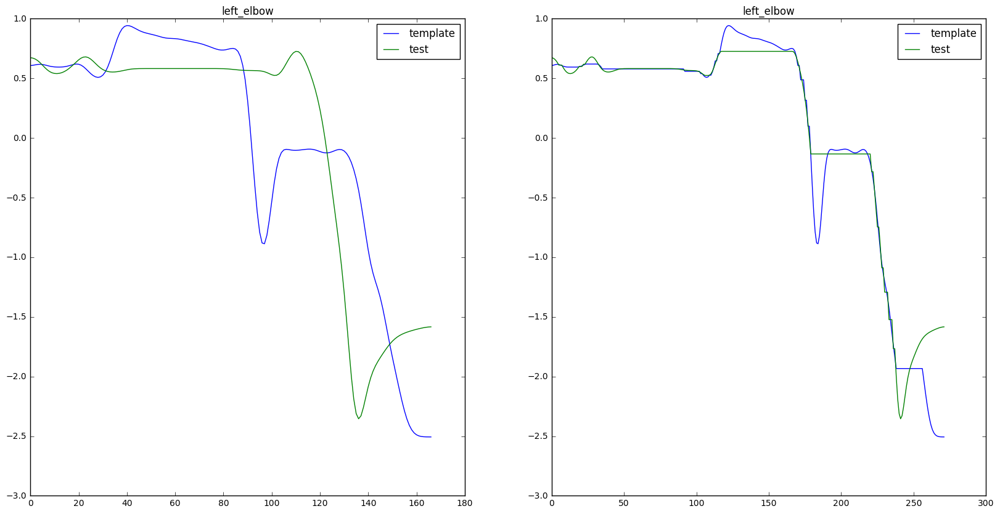

...

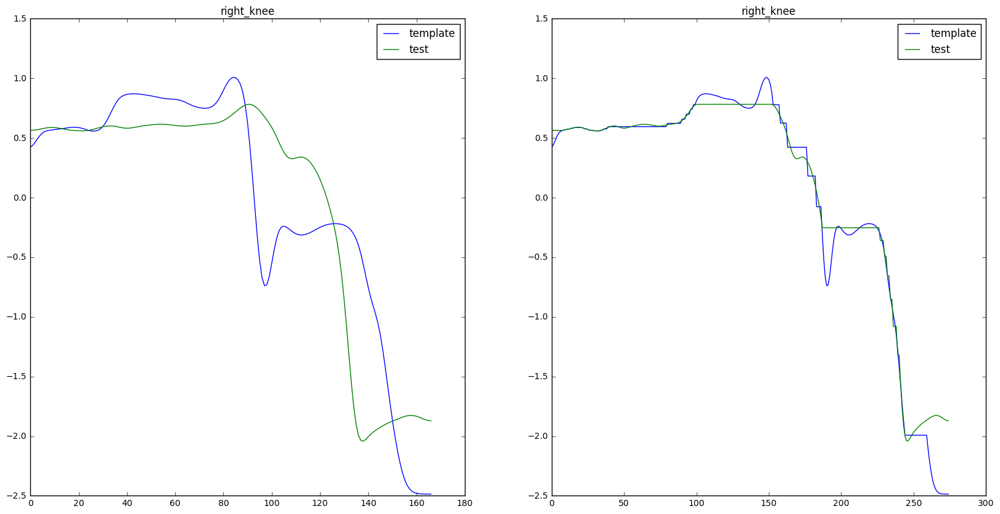

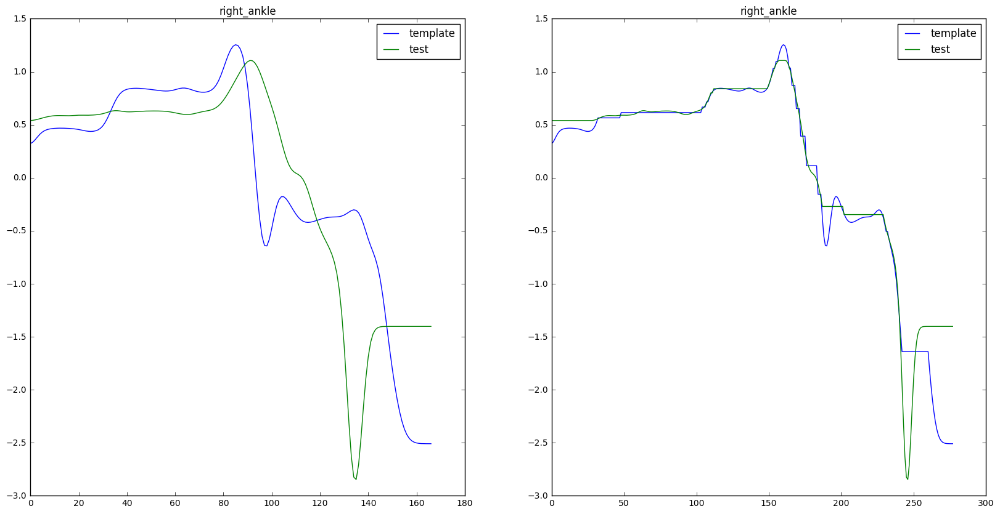

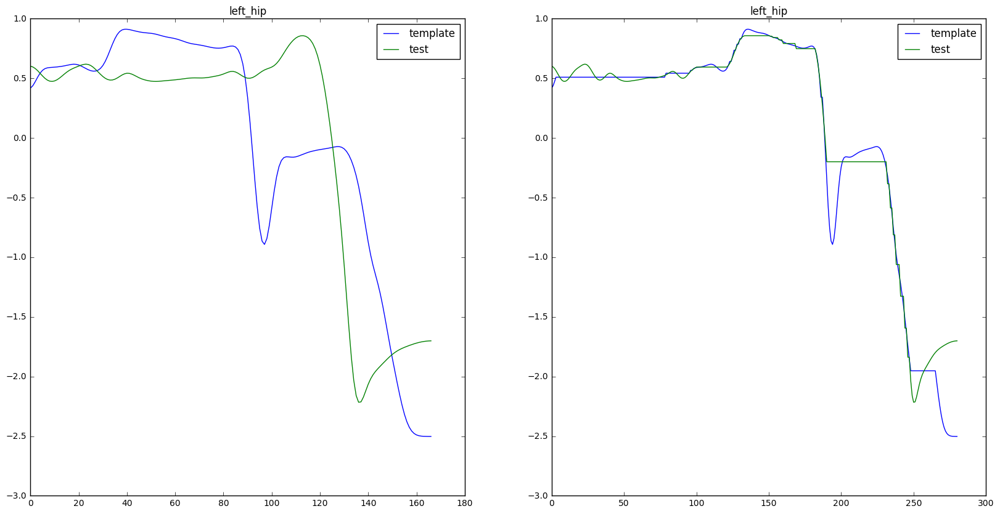

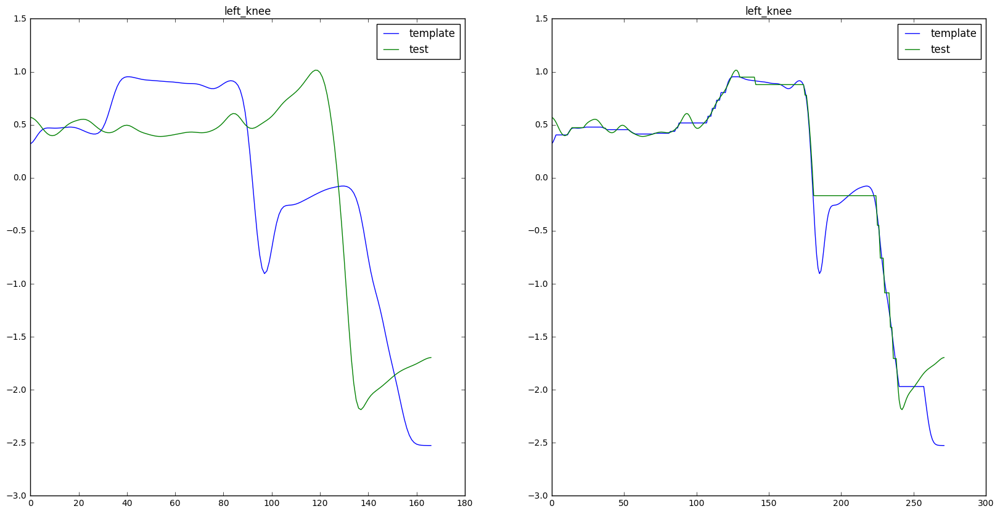

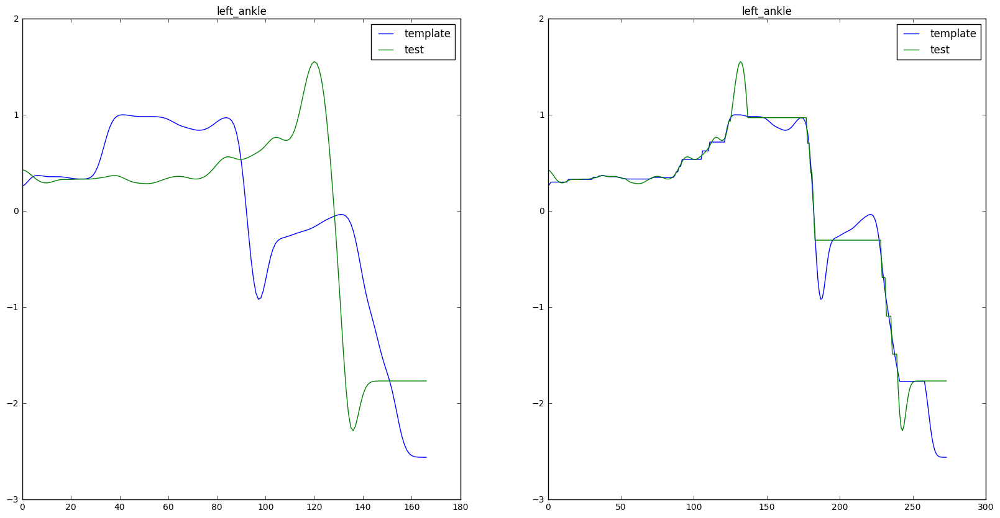

[122, 124, 120, 118, 123, 119, 125, 126, 118, 126, 128, 129]


123

In [24]:
temp = joints_array_batter[2]
dtak_nn(temp, joints_array_batter[files.index("aa7193ad-30f0-4f3e-becb-4f68d0b65130")], 126, plot= True)

(167, 18) (167, 18)
(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  50,
        50,  51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,
        62,  62,  63,  64,  65,  66,  67,  68,  69,  70,  71,  72,  73,
        74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,
        87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,  98,  99,
       100, 101, 101, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110,
       111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123,
       124, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 134,
       135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147,
       147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159,
       160, 161, 162, 163, 164, 165, 166]),

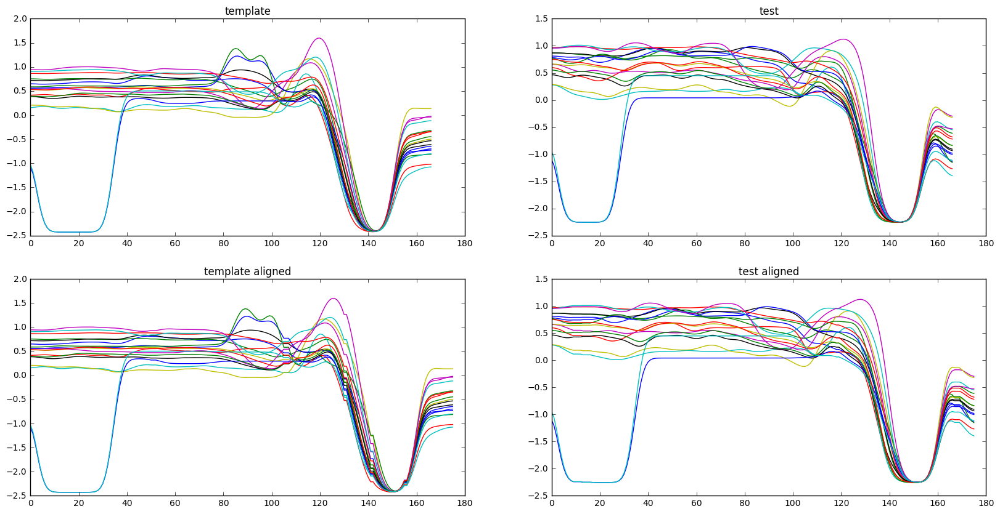

In [49]:
def plotting_2(x, y, path, title):
    fig = plt.figure(figsize = (20,10))
    ax = fig.add_subplot(2,2,1)
    plt.plot(x) #, label = "template")
    # plt.legend()
    plt.title("template")
    # plt.show()
    ax = fig.add_subplot(2,2,2)
    plt.plot(y, label = "test")
    plt.title("test")
    
    ax = fig.add_subplot(2,2,3)
    plt.plot(x[path[0]], label = "template")
    # plt.legend()
    plt.title("template aligned")
    #plt.show()
    
    ax = fig.add_subplot(2,2,4)
    plt.plot(y[path[1]], label = "test")
    # plt.legend()
    plt.title("test aligned")
    plt.show()
    

xy = 1
test_sequ = joints_array_batter[0, :, :, xy]
test_sequ = (test_sequ-np.mean(test_sequ))/np.std(test_sequ)
# for i in range(2, 3): #len(labels_first_ten)):
sequ = joints_array_batter[1, :,:,xy]
sequ = (sequ-np.mean(sequ))/np.std(sequ)
    # plt.plot(sequ, label = i)
x = sequ
y = test_sequ
print(x.shape, y.shape)
dist, cost, acc, path = fastdtw(x, y, dist=lambda x, y: np.linalg.norm(x - y))
print(path)
plotting_2(x,y, path, "test")

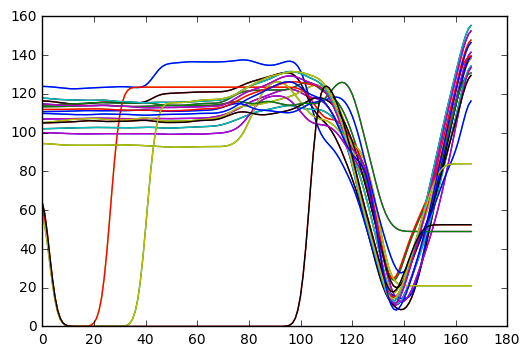

In [22]:
plt.plot(joints_array_batter[0,:,:,1])
plt.show()

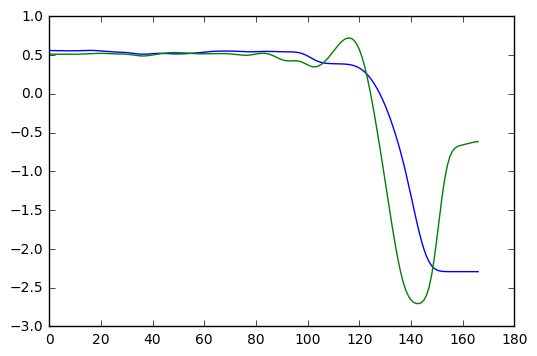

140 130
84 116


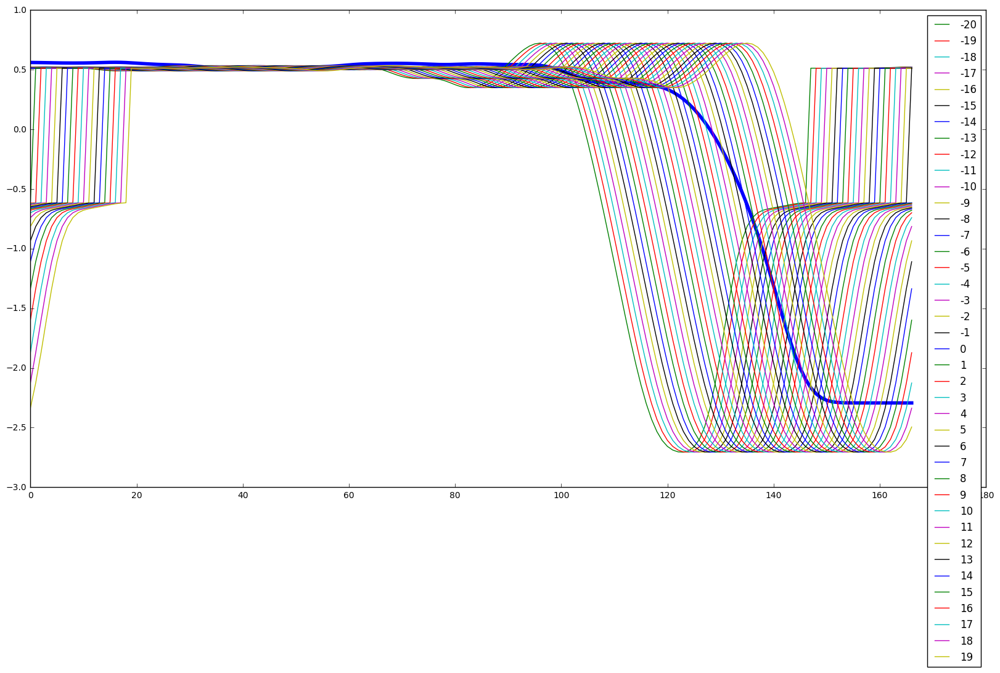

[0.88385969904982931, 0.86890547550462294, 0.85355508926700063, 0.8379291561683927, 0.82151250937404174, 0.80450814455928443, 0.78638775610784029, 0.76722931959654406, 0.74720670924850552, 0.72575366715481759, 0.7032188317700413, 0.67968646407796729, 0.65488709939596901, 0.62886326867210307, 0.60205669567966114, 0.57441036430471382, 0.5457932109664233, 0.51669534349306678, 0.4872166878827357, 0.45738965593190162, 0.42754861139315353, 0.41100773823682346, 0.39467212614270591, 0.37908805946025093, 0.36487118934295093, 0.35226404013437135, 0.34189030828041, 0.3339922772065983, 0.32867376282192939, 0.32721017847571437, 0.33002496689133276, 0.33796538549794619, 0.34965891809071853, 0.36483993464649372, 0.38270617730485373, 0.4035552479361495, 0.42765209104615159, 0.45512084161642224, 0.48574047849751362, 0.51820048084330583]
29
117


In [305]:
label = 126
xn = normalize(joints_array_batter[0, :, :12, 1])# [90:160]
yn = normalize(joints_array_batter[3, :, :12, 1])
plt.plot(np.mean(xn, axis = 1))
plt.plot(np.mean(yn, axis = 1))
plt.show()
diff = []
gradx = np.gradient(xn, axis = 0)
grady = np.gradient(yn, axis = 0)
minx = np.argmin(np.mean(gradx, axis = 1))
miny = np.argmin(np.mean(grady, axis = 1))
grad_shift = minx-miny

print(minx, miny)
from scipy.signal import argrelextrema
maxx = np.array(argrelextrema(np.mean(xn, axis = 1), np.greater))[0]
maxy = np.array(argrelextrema(np.mean(yn, axis = 1), np.greater))[0]

maxx = (maxx[np.where(maxx<minx)[0]])[-1]
maxy = (maxy[np.where(maxy<minx)[0]])[-1]
print(maxx, maxy)

plt.figure(figsize = (20,10))
plt.plot(np.mean(xn, axis = 1), linewidth = 4)

for i in range(-20, 20):
    new = np.roll(yn, i, axis = 0)
    plt.plot(np.mean(new, axis =1), label = i)
    diff.append(np.mean(np.absolute(new-xn)))
plt.legend()
plt.show()
print(diff)
print(np.argmin(diff))
print(label-np.argmin(diff)+20)

In [1]:
import json
with open("first_move_frames.json", "r") as inf:
    dic = json.load(inf)
print(len(dic.keys()))

364
